In [1]:
# Run this cell to configure Tensorflow to use your GPU
import tensorflow as tf
for gpu in tf.config.experimental.list_physical_devices('GPU'):
    print(gpu)
    tf.config.experimental.set_memory_growth(gpu, True)

PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [2]:
import tensorflow as tf
import tensorflow_hub as hub

# See https://tfhub.dev/ to find other models.
# Average inference time on 24 CPUs = 96 ms
module = 'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/2'

detector = hub.load(module)

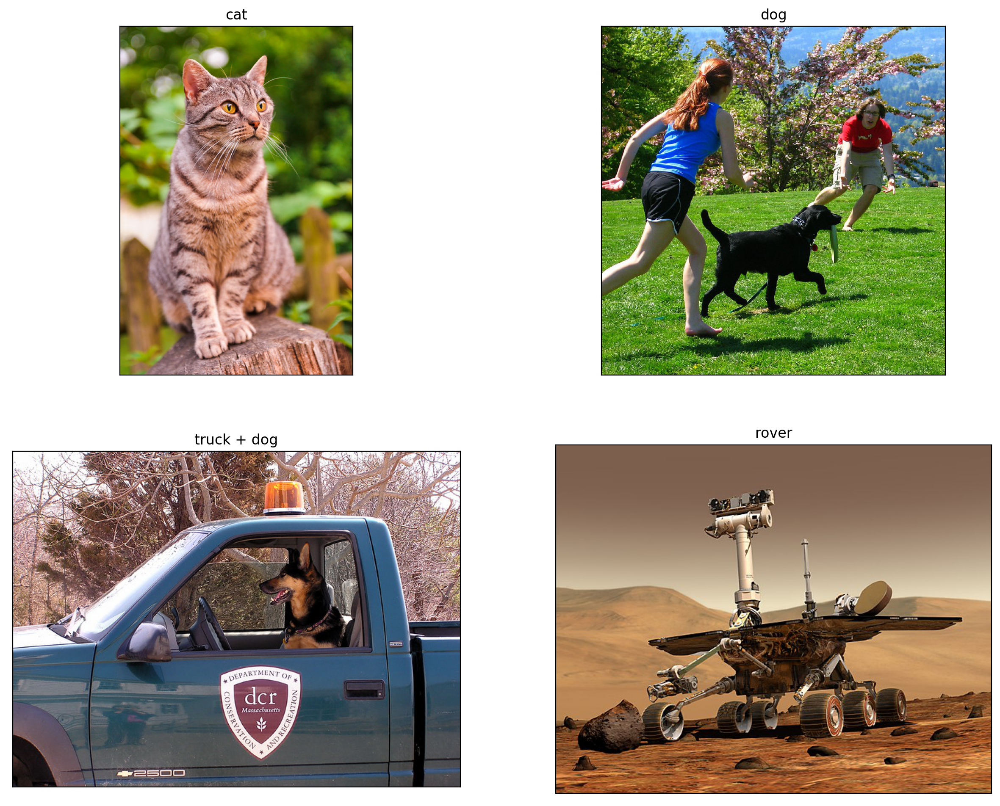

In [3]:
from utils.plot import *

# Loads a tiny batch of images from Internet
images_raw = load_tiny_batch()
plot_images_grid(images_raw)

In [4]:
import numpy as np
import pandas as pd

model_inputs = {name: np.expand_dims(np.array(image), 0) for name, image in images_raw.items()}

In [5]:
%%time

# Running a forward pass through the network with the input image.
model_outputs = {
    name: detector(image_input)
    for name, image_input in model_inputs.items()
}

CPU times: user 5.77 s, sys: 7.85 s, total: 13.6 s
Wall time: 21.6 s


In [6]:
# The result is a dictionary of tensors, so let's look at the shapes.
{name: r.shape for name, r in model_outputs['cat'].items()}

{'detection_classes': TensorShape([1, 100]),
 'num_detections': TensorShape([1]),
 'detection_boxes': TensorShape([1, 100, 4]),
 'raw_detection_boxes': TensorShape([1, 1917, 4]),
 'detection_scores': TensorShape([1, 100]),
 'raw_detection_scores': TensorShape([1, 1917, 91]),
 'detection_anchor_indices': TensorShape([1, 100]),
 'detection_multiclass_scores': TensorShape([1, 100, 91])}

In [7]:
# We need to load a mapping between integer class IDs and English labels.
# There is a helper function in utils folder to do just that.
# Note that integer IDs are in range [1, 90] but there are only 80 classes in MS COCO dataset.

from utils.mscoco import load_class_map
class_map = load_class_map()
class_map

,label
id,
1,person
2,bicycle
3,car
4,motorcycle
5,airplane
...,...
86,vase
87,scissors
88,teddy bear


In [11]:
# Now we can use the data frame from above to convert
# the model output (integer IDs) to the corresponding English labels.

def model_output_to_scores_df(model_output: dict) -> pd.DataFrame:
    class_ids = model_output['detection_classes'][0].numpy().astype(int)
    class_labels = class_map.loc[class_ids].reset_index(drop=True)
    class_scores = pd.Series(model_output['detection_scores'][0].numpy()).rename('score')

    class_predictions = pd.concat([class_labels, class_scores], axis=1)
    class_predictions = class_predictions.sort_values('score', ascending=False)
    
    return class_predictions

def plot_image_with_boxes(input_image: np.ndarray, model_output: dict):
    class_ids = model_output['detection_classes'][0].numpy().astype(int)
    class_labels = class_map.loc[class_ids].reset_index(drop=True)
    
    image_with_boxes = draw_boxes(
        np.array(input_image[0]), 
        model_output["detection_boxes"][0],
        class_labels.label.values,
        model_output["detection_scores"][0],
        min_score=0.50
    )
    plt.figure(figsize=[10, 10])
    plot_image(image_with_boxes)

,label,score
0,cat,0.843820
1,bench,0.238308
2,dog,0.228259
3,bench,0.210737
4,apple,0.210514


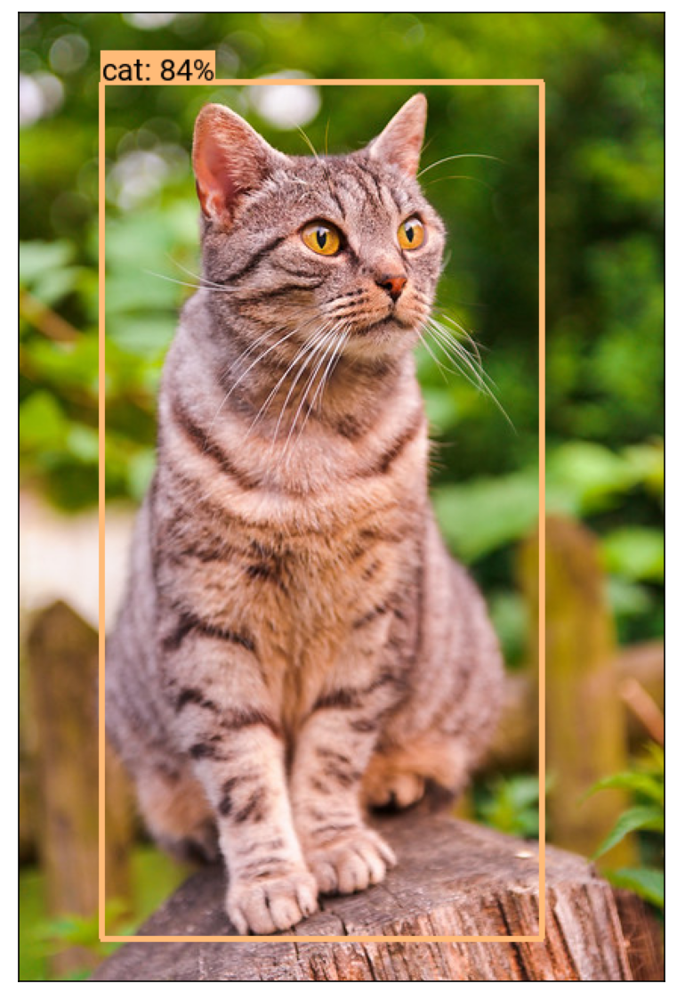

In [12]:
plot_image_with_boxes(model_inputs['cat'], model_outputs['cat'])
model_output_to_scores_df(model_outputs['cat']).head(5)

,label,score
0,dog,0.842378
1,person,0.822815
2,person,0.819651
3,frisbee,0.422578
4,bottle,0.279023


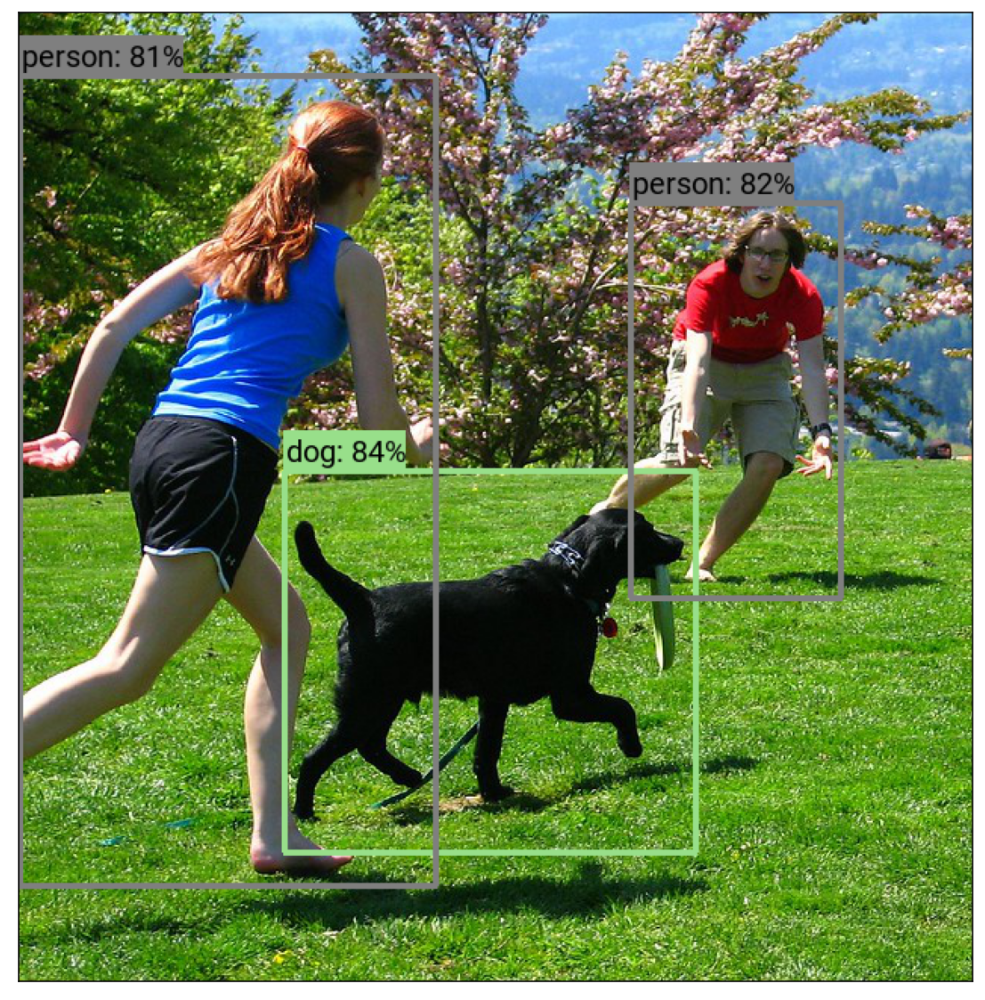

In [13]:
plot_image_with_boxes(model_inputs['dog'], model_outputs['dog'])
model_output_to_scores_df(model_outputs['dog']).head(5)

,label,score
0,car,0.590962
1,dog,0.574908
2,cat,0.443444
3,truck,0.424321
4,dog,0.413037


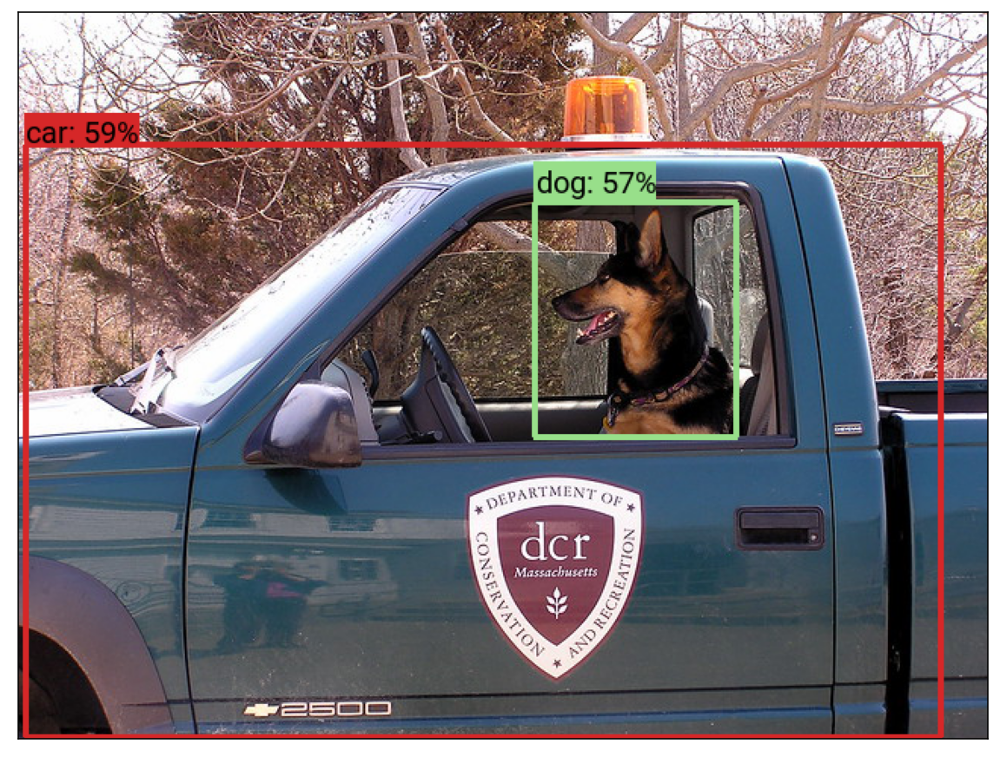

In [14]:
plot_image_with_boxes(model_inputs['truck + dog'], model_outputs['truck + dog'])
model_output_to_scores_df(model_outputs['truck + dog']).head(5)

,label,score
0,airplane,0.750553
1,truck,0.572093
2,truck,0.522662
3,truck,0.486036
4,person,0.483850


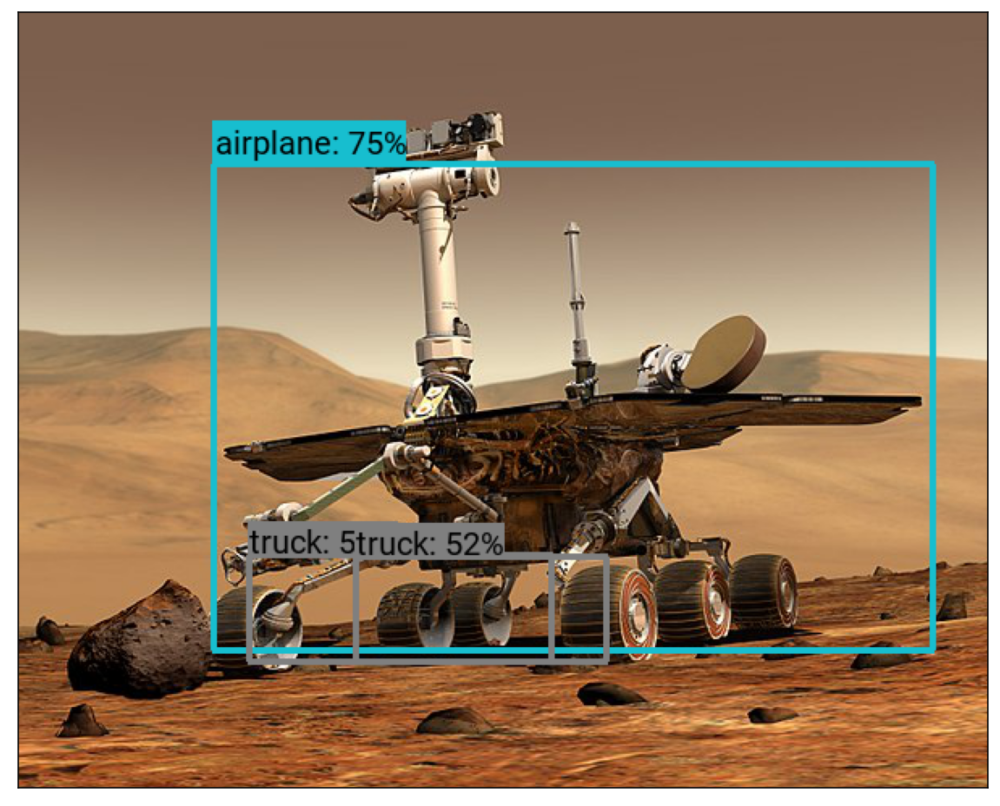

In [15]:
plot_image_with_boxes(model_inputs['rover'], model_outputs['rover'])
model_output_to_scores_df(model_outputs['rover']).head(5)